In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from ipywidgets import interact, widgets
import os
from sklearn.model_selection import train_test_split

In [ ]:
csv_path = '/Users/bragehs/Documents/train_v2.csv'
labels_df = pd.read_csv(csv_path)

labels_df.head()

labels_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40479 entries, 0 to 40478
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_name  40479 non-null  object
 1   tags        40479 non-null  object
dtypes: object(2)
memory usage: 632.6+ KB


Filtering, relabeling and balancing dataset...
Original dataset size: 40479
After filtering for clear images: 28431
After removing images with only background label: 10656
Found 9810 background,plantation images, limiting to 1000
Final dataset size after balancing: 1846

Label distribution after relabeling and balancing:
background: 1846 images (100.00%)
plantation: 1272 images (68.91%)
mining: 373 images (20.21%)
logging: 308 images (16.68%)
grassland_shrubland: 173 images (9.37%)

Combined label distribution:
background,plantation: 1000 images (54.17%)
background,mining: 309 images (16.74%)
background,logging: 236 images (12.78%)
background,grassland_shrubland,plantation: 148 images (8.02%)
background,logging,plantation: 64 images (3.47%)
background,mining,plantation: 58 images (3.14%)
background,grassland_shrubland: 23 images (1.25%)
background,logging,mining: 5 images (0.27%)
background,grassland_shrubland,logging: 1 images (0.05%)
background,grassland_shrubland,logging,plantation:

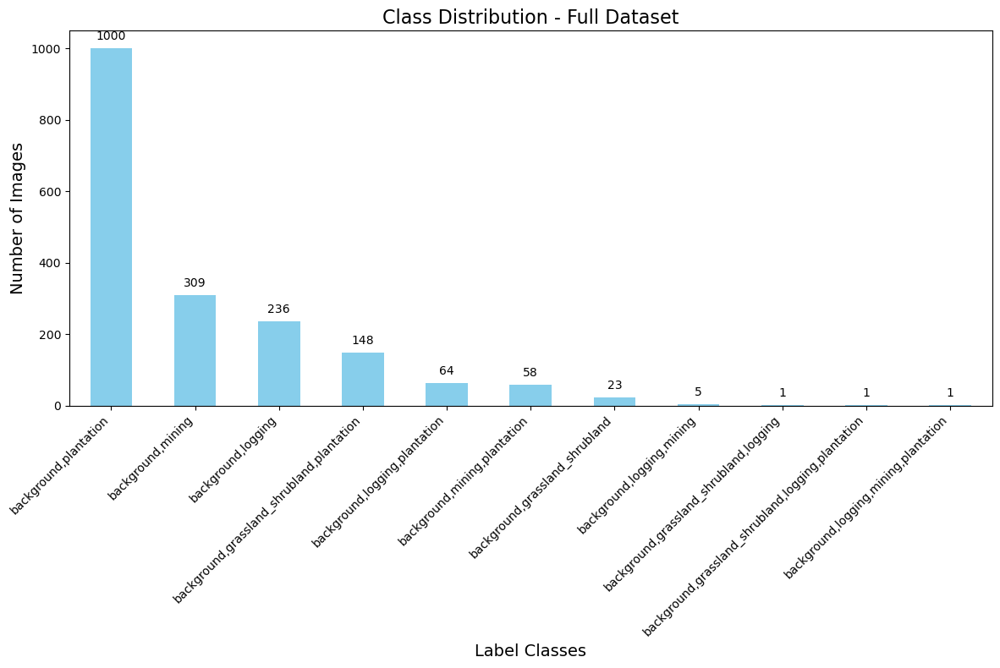

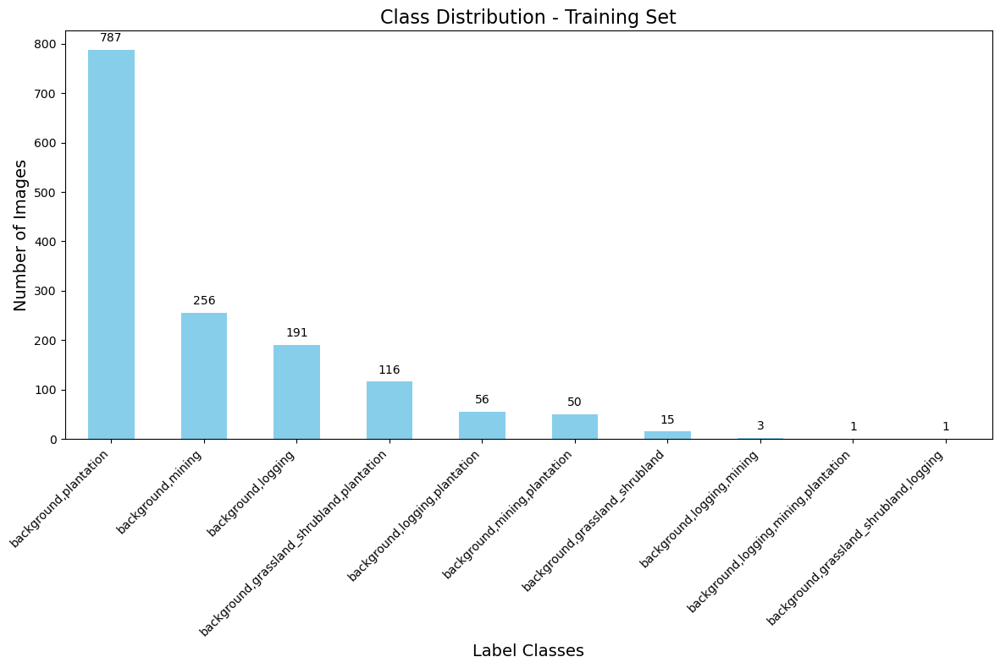

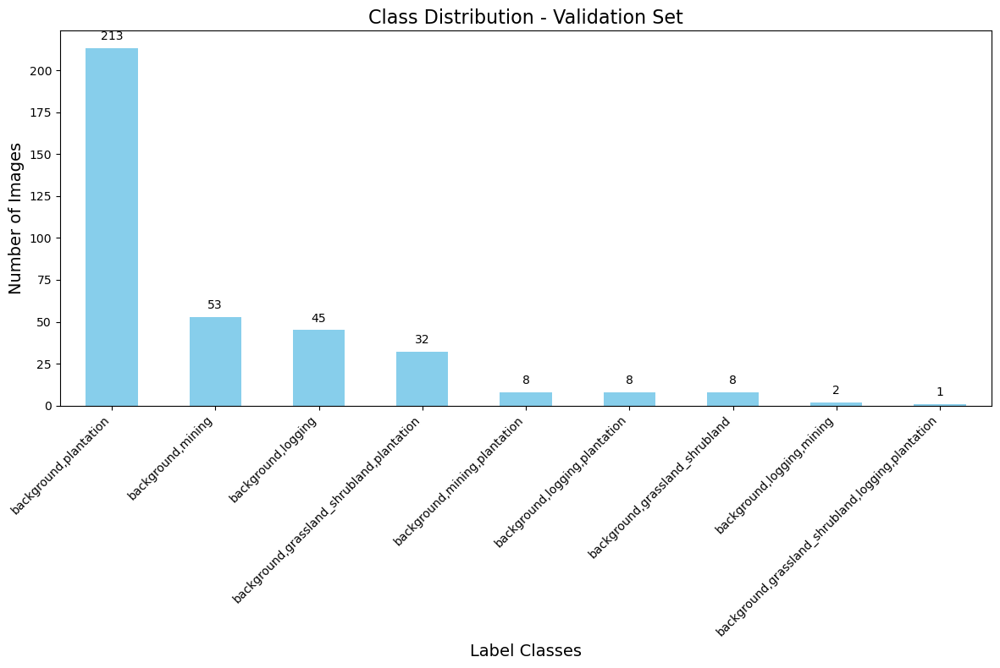


Displaying examples for category: mining


/opt/anaconda3/envs/satlaspretrain/lib/python3.9/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


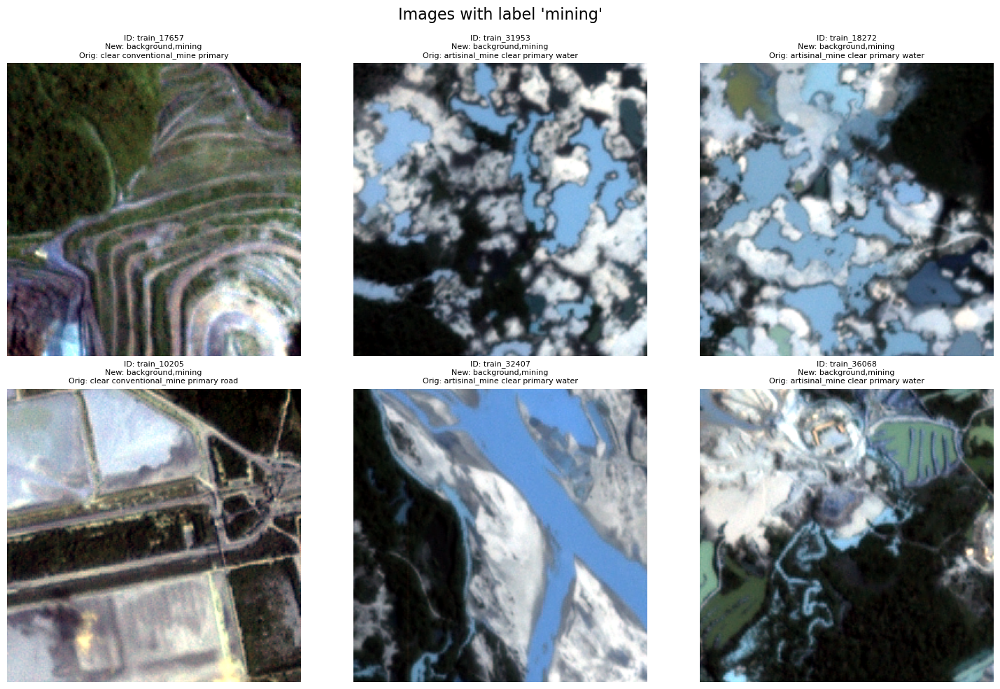


Displaying examples for category: plantation


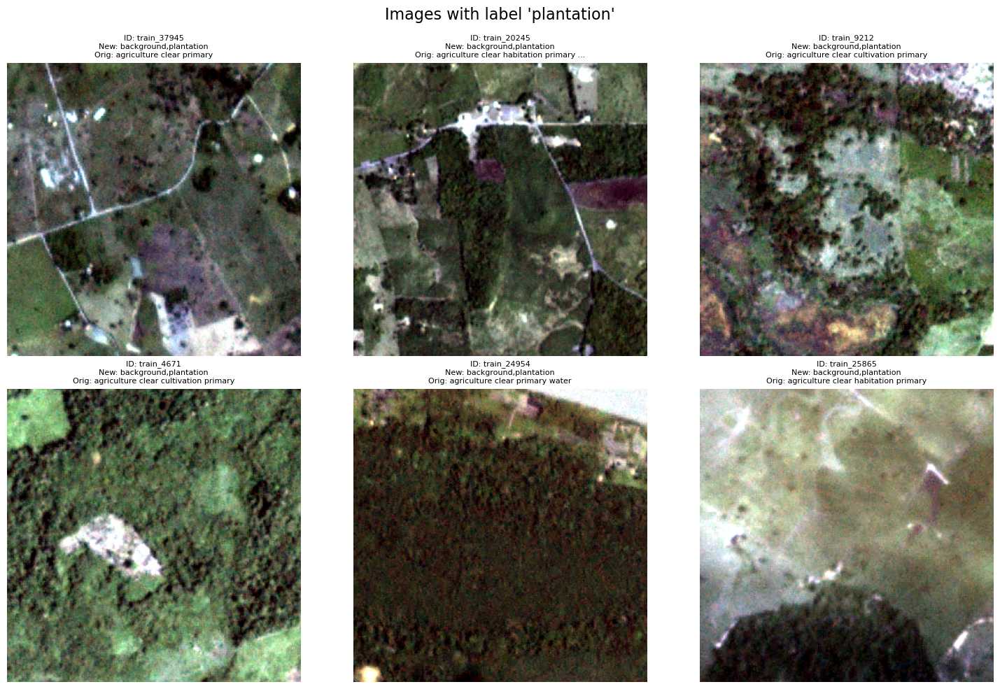


Displaying examples for category: logging


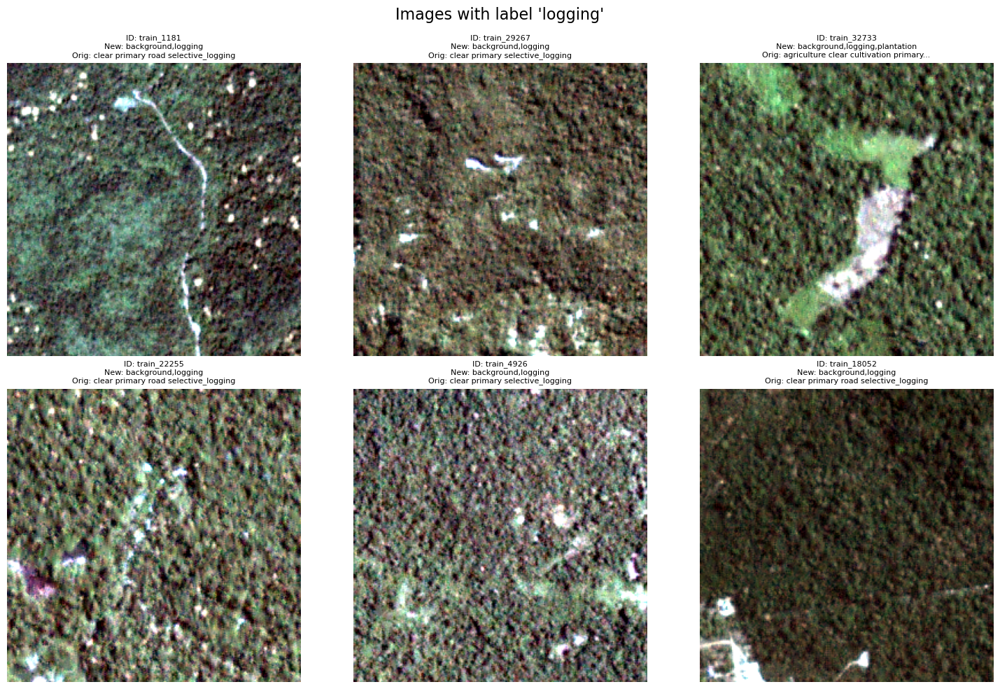


Displaying examples for category: grassland_shrubland


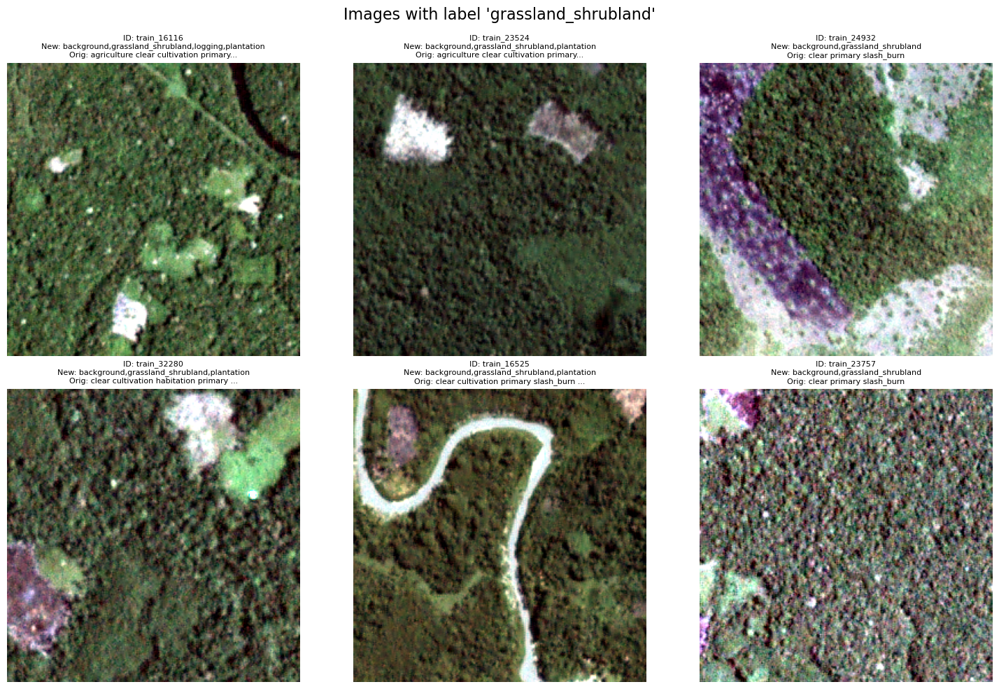

In [ ]:
# Define a function to filter, relabel, and balance the dataset
def filter_relabel_and_balance_dataset(df, label_column='tags', max_background_plantation=1000):
    """
    Filter the dataset to include only:
    1. Images with 'clear' label and not 'cloudy', 'partly_cloudy', or 'haze'
    2. Images that contain at least one of the specified labels of interest
    3. Limit the number of background,plantation images
    
    Also create new labels based on the specified mapping.
    
    Parameters:
    df (pandas.DataFrame): The input dataframe with image labels.
    label_column (str): Column name containing the labels.
    max_background_plantation (int): Maximum number of background,plantation images to keep.
    
    Returns:
    pandas.DataFrame: Filtered, relabeled, and balanced dataframe.
    """
    # First, make a copy of the dataframe to avoid modifying the original
    filtered_df = df.copy()
    
    # Step 1: Filter to keep only 'clear' images and remove cloudy/hazy ones
    clear_mask = filtered_df[label_column].str.contains('clear') 
    cloudy_mask = filtered_df[label_column].str.contains('cloudy|haze')
    filtered_df = filtered_df[clear_mask & ~cloudy_mask]
    
    print(f"Original dataset size: {len(df)}")
    print(f"After filtering for clear images: {len(filtered_df)}")
    
    # Define the label mapping
    label_mapping = {
        'conventional_mine': 'mining',
        'artisinal_mine': 'mining',
        'agriculture': 'plantation',
        'cultivation': 'plantation',
        'selective_logging': 'logging',
        'slash_burn': 'grassland_shrubland'
    }
    
    # Initialize a list to hold the new labels for each image and a mask for filtering
    new_labels = []
    keep_mask = []
    
    # Process each row to determine the new label
    for idx, row in filtered_df.iterrows():
        label_str = row[label_column]
        labels = set(label_str.split())
        
        # Initialize with empty set
        new_label = set()
        
        # Track if any label of interest is found
        found_label_of_interest = False
        
        # Check for each specific label and add the corresponding new label
        for old_label, new_label_val in label_mapping.items():
            if old_label in labels:
                new_label.add(new_label_val)
                found_label_of_interest = True
        
        # Keep track of which rows to keep (those with at least one label of interest)
        keep_mask.append(found_label_of_interest)
        
        # Add "background" to all images (it will represent everything else)
        new_label.add('background')
        
        # Join all labels with comma (sorted for consistency)
        new_labels.append(','.join(sorted(new_label)))
    
    # Assign the new labels to the dataframe
    filtered_df['new_label'] = new_labels
    
    # Filter to keep only images with at least one label of interest
    filtered_df = filtered_df[keep_mask]
    
    print(f"After removing images with only background label: {len(filtered_df)}")
    
    # Step 3: Balance the dataset by limiting background,plantation images
    background_plantation_mask = filtered_df['new_label'] == 'background,plantation'
    bp_count = background_plantation_mask.sum()
    
    if bp_count > max_background_plantation:
        print(f"Found {bp_count} background,plantation images, limiting to {max_background_plantation}")
        
        # Split into the two groups
        bp_df = filtered_df[background_plantation_mask]
        other_df = filtered_df[~background_plantation_mask]
        
        # Randomly sample from the background,plantation images
        bp_df_sampled = bp_df.sample(max_background_plantation, random_state=42)
        
        # Combine with the rest of the images
        filtered_df = pd.concat([other_df, bp_df_sampled])
        
        print(f"Final dataset size after balancing: {len(filtered_df)}")
    
    # Count occurrences of each new label
    label_counts = {}
    for labels in filtered_df['new_label']:
        for label in labels.split(','):
            label_counts[label] = label_counts.get(label, 0) + 1
    
    print("\nLabel distribution after relabeling and balancing:")
    for label, count in sorted(label_counts.items(), key=lambda x: x[1], reverse=True):
        print(f"{label}: {count} images ({count/len(filtered_df)*100:.2f}%)")
    
    # Count combined labels distribution
    combined_label_counts = filtered_df['new_label'].value_counts()
    
    print("\nCombined label distribution:")
    for labels, count in combined_label_counts.items():
        print(f"{labels}: {count} images ({count/len(filtered_df)*100:.2f}%)")
    
    # Create a simplified label for stratification (primary label only)
    # This addresses the issue with rare label combinations
    filtered_df['stratify_label'] = filtered_df['new_label'].apply(
        lambda x: x.split(',')[0] if ',' in x else x
    )

    
    # Remove the temporary stratification column
    filtered_df = filtered_df.drop(columns=['stratify_label'])
    
    return filtered_df

# Function to visualize the class distribution
def plot_class_distribution(df, title="Class Distribution"):
    plt.figure(figsize=(12, 8))
    
    # Sort by frequency
    value_counts = df['new_label'].value_counts()
    
    # Only show top 20 classes if there are many
    if len(value_counts) > 20:
        value_counts = value_counts.head(20)
        title += " (Top 20 Classes)"
    
    ax = value_counts.plot(kind='bar', color='skyblue')
    plt.title(title, fontsize=16)
    plt.xlabel('Label Classes', fontsize=14)
    plt.ylabel('Number of Images', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.tight_layout()
    
    # Add count labels on top of bars
    for p in ax.patches:
        ax.annotate(f"{int(p.get_height())}", 
                    (p.get_x() + p.get_width() / 2, p.get_height()), 
                    ha = 'center', va = 'bottom', 
                    xytext = (0, 5), textcoords = 'offset points')
    
    plt.show()

# Function to visualize images with their new labels
def display_images_with_new_labels(df, category=None, num_images=9):
    """
    Display images with their new labels.
    
    Parameters:
    df (pandas.DataFrame): The filtered and relabeled dataframe.
    category (str, optional): If provided, only show images with this category in their new label.
    num_images (int): Number of images to display.
    """
    if category:
        subset = df[df['new_label'].str.contains(category)]
        title = f"Images with label '{category}'"
    else:
        subset = df
        title = "Sample images with new labels"
    
    if len(subset) == 0:
        print(f"No images found with category '{category}'")
        return
    
    # Sample images to display
    to_display = subset.sample(min(num_images, len(subset)))
    
    # Create a grid of images
    num_cols = 3
    num_rows = (min(len(to_display), num_images) + num_cols - 1) // num_cols
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))
    
    # Make axes a 2D array even if there's only one row
    if num_rows == 1 and num_cols == 1:
        axes = np.array([[axes]])
    elif num_rows == 1:
        axes = np.array([axes])
    elif num_cols == 1:
        axes = axes.reshape(-1, 1)
    
    for i, (idx, row) in enumerate(to_display.iterrows()):
        image_id = row.get('image_name', str(idx))
        image_path = f'/Users/bragehs/Documents/train-tif-v2/{image_id}.tif'
        
        # Display original labels and new labels
        original_labels = row.get(label_column, 'Unknown')
        new_label = row.get('new_label', 'Unknown')
        
        # Load image
        try:
            with rasterio.open(image_path) as src:
                # Read all bands
                image = src.read()
                
                # Normalize for visualization
                image = image.astype(np.float32)
                for band in range(image.shape[0]):
                    band_min, band_max = np.percentile(image[band], (1, 99))
                    image[band] = np.clip(image[band], band_min, band_max)
                    image[band] = (image[band] - band_min) / (band_max - band_min)
                
                # Transpose to (height, width, channels) for plotting
                image = np.transpose(image, (1, 2, 0))
                
                # Plot in the grid
                r, c = i // num_cols, i % num_cols
                ax = axes[r, c]
                
                # Display image - use the first 3 bands for RGB display
                num_bands = image.shape[2]

                if num_bands >= 3:
                    rgb_image = image[:, :, :3]  # Use first 3 bands
                    
                # Make sure to scale values properly
                rgb_image = np.clip(rgb_image, 0, 1)
                ax.imshow(rgb_image)
                
                # Set title with wrapped text for better readability
                title_text = f"ID: {image_id}\nNew: {new_label}"
                if len(str(original_labels)) > 40:
                    orig_wrapped = str(original_labels)[:37] + "..."
                else:
                    orig_wrapped = str(original_labels)
                title_text += f"\nOrig: {orig_wrapped}"
                
                ax.set_title(title_text, fontsize=8)
                ax.axis('off')
                
        except Exception as e:
            print(f"Error loading image {image_id}: {e}")
            r, c = i // num_cols, i % num_cols
            axes[r, c].text(0.5, 0.5, f"Error loading {image_id}\n{e}", 
                          ha='center', va='center', fontsize=8, color='red')
            axes[r, c].axis('off')
    
    # Hide unused axes
    for i in range(len(to_display), num_rows * num_cols):
        r, c = i // num_cols, i % num_cols
        axes[r, c].axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

# Example usage
label_column = 'tags'  # Update this to match your actual column name

print("Filtering, relabeling and balancing dataset...")
filtered_df = filter_relabel_and_balance_dataset(
    labels_df, 
    label_column=label_column, 
    max_background_plantation=1000
)

# Save the processed datasets to CSV files
filtered_df.to_csv('filtered_balanced_dataset.csv', index=False)

print("\nDatasets saved to CSV files:")
print("- 'filtered_balanced_dataset.csv' (full dataset)")


# Visualize class distributions
plot_class_distribution(filtered_df, "Class Distribution - Full Dataset")

# Display examples of each category
for category in ['mining', 'plantation', 'logging', 'grassland_shrubland']:
    print(f"\nDisplaying examples for category: {category}")
    display_images_with_new_labels(filtered_df, category, num_images=6)

In [44]:
test = pd.read_csv("filtered_balanced_dataset.csv")
test

,image_name,tags,new_label
0,train_10,agriculture clear primary slash_burn water,"background,grassland_shrubland,plantation"
1,train_57,artisinal_mine bare_ground clear primary water,"background,mining"
2,train_82,blooming clear cultivation habitation primary ...,"background,grassland_shrubland,plantation"
3,train_151,agriculture clear cultivation primary selectiv...,"background,logging,plantation"
4,train_166,clear primary road selective_logging water,"background,logging"
...,...,...,...
1841,train_1262,agriculture clear primary road,"background,plantation"
1842,train_8535,agriculture clear primary,"background,plantation"
1843,train_1430,agriculture clear primary,"background,plantation"
1844,train_22260,agriculture clear cultivation primary road,"background,plantation"


In [ ]:
from original_utils import PreProcessing

In [2]:
img_label_data = PreProcessing(train_set=False, satlas=False, img_labels=True)
img_label_data.preprocess()
img_label_data.save_preprocessed(filename='/image_label_data.npy', labels = False)

Loaded 1846 images
Processing train_1.tif
Processing train_8.tif
Processing train_10.tif
Processing train_36.tif
Processing train_57.tif
Processing train_58.tif
Processing train_82.tif
Processing train_94.tif
Processing train_122.tif
Processing train_129.tif
Processing train_146.tif
Processing train_151.tif
Processing train_159.tif
Processing train_166.tif
Processing train_185.tif
Processing train_187.tif
Processing train_199.tif
Processing train_213.tif
Processing train_237.tif
Processing train_247.tif
Processing train_274.tif
Processing train_281.tif
Processing train_286.tif
Processing train_309.tif
Processing train_324.tif
Processing train_358.tif
Processing train_379.tif
Processing train_381.tif
Processing train_391.tif
Processing train_421.tif
Processing train_448.tif
Processing train_456.tif
Processing train_464.tif
Processing train_465.tif
Processing train_477.tif
Processing train_521.tif
Processing train_544.tif
Processing train_552.tif
Processing train_590.tif
Processing train

/opt/anaconda3/envs/satlaspretrain/lib/python3.9/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


Processing train_746.tif
Processing train_750.tif
Processing train_871.tif
Processing train_997.tif
Processing train_1066.tif
Processing train_1087.tif
Processing train_1089.tif
Processing train_1093.tif
Processing train_1115.tif
Processing train_1134.tif
Processing train_1143.tif
Processing train_1151.tif
Processing train_1163.tif
Processing train_1181.tif
Processing train_1188.tif
Processing train_1238.tif
Processing train_1262.tif
Processing train_1278.tif
Processing train_1309.tif
Processing train_1319.tif
Processing train_1337.tif
Processing train_1340.tif
Processing train_1341.tif
Processing train_1352.tif
Processing train_1359.tif
Processing train_1364.tif
Processing train_1373.tif
Processing train_1386.tif
Processing train_1418.tif
Processing train_1430.tif
Processing train_1434.tif
Processing train_1436.tif
Processing train_1465.tif
Processing train_1501.tif
Processing train_1502.tif
Processing train_1527.tif
Processing train_1533.tif
Processing train_1564.tif
Processing train